# PCA with AUSTEN

```yaml
Course:   DS 5001
Module:   07 Lab
Topic:    PCA
Author:   R.C. Alvarado
Date:     28 Februrary 2023 (revised)
```

**Purpose:**  Implement PCA with the works of Austen.

# Set Up

## Import

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [2]:
import plotly_express as px
import seaborn as sns

In [3]:
sns.set(style='ticks')

## Config

In [4]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
output_dir = config['DEFAULT']['output_dir']

In [5]:
data_prefix = 'austen-melville'
OHCO = ['book_id', 'chap_id']
colors = "YlGnBu" 

# Prepare the Data

## Import tables

**Downloads**

- [austen-melville-VOCAB2.csv](https://www.dropbox.com/scl/fi/u4t0o5zpoaunyi4l5dklr/austen-melville-VOCAB2.csv?rlkey=5m3fiuucraflg4ntoxqc0t3hv&dl=0)
- [austen-melville-LIB_LABELS.csv](https://www.dropbox.com/scl/fi/f63v0pjqemsody71c9sun/austen-melville-LIB_LABELS.csv?rlkey=0ue1mz9x2ycqybcwti0vsnm9y&dl=0)
- [austen-melville-TFIDF_chap_L2.csv](https://www.dropbox.com/scl/fi/25vtge2qf1b5fed9or1y6/austen-melville-TFIDF_chap_L2.csv?rlkey=fkz9yk0enmlzt3z85ouusgcy2&dl=0)

In [6]:
VOCAB = pd.read_csv(f'{output_dir}/{data_prefix}-VOCAB2.csv').set_index('term_str')
LIB = pd.read_csv(f'{output_dir}/{data_prefix}-LIB_LABELS.csv').set_index('book_id')
TFIDF = pd.read_csv(f'{output_dir}/{data_prefix}-TFIDF_chap_L2.csv').set_index(['book_id', 'chap_id'])

## Generate analytical tables

In [7]:
class AUSTEN: pass

In [8]:
AUSTEN.LIB = LIB[LIB.author.str.match('AUSTEN')]
AUSTEN.TFIDF = TFIDF.loc[AUSTEN.LIB.index]

In [9]:
AUSTEN.TFIDF

sure     hands     short       new      word    passed  \
book_id chap_id                                                               
105     1       -0.012271  0.003859 -0.007822  0.016705  0.004818  0.004608   
        2       -0.012271  0.007178  0.024156 -0.009181  0.008190 -0.007954   
        3        0.014675  0.004502  0.005497 -0.009181  0.005471 -0.007954   
        4       -0.012271 -0.008847  0.041215 -0.009181  0.008554 -0.007954   
        5        0.026462  0.003946 -0.007822  0.016880  0.017906 -0.007954   
...                   ...       ...       ...       ...       ...       ...   
1342    57       0.005548 -0.008847  0.009793 -0.009181 -0.008095 -0.007954   
        58       0.002259 -0.008847  0.006541 -0.009181  0.021165  0.006278   
        59       0.047190  0.005882 -0.007822 -0.009181 -0.008095  0.050290   
        60       0.007553 -0.008847 -0.007822 -0.009181 -0.008095 -0.007954   
        61       0.031753 -0.008847 -0.007822 -0.009181 -0.008095 -0.007954   

                     fine      name     given     sight  ...    dreamy  \
book_id chap_id                                          ...             
105     1        0.004317  0.017191  0.044287 -0.007747  ... -0.001295   
        2       -0.008626 -0.008281  0.008758 -0.007747  ... -0.001295   
        3       -0.008626  0.085380  0.006026  0.005756  ... -0.001295   
        4        0.008062  0.008140  0.025849 -0.007747  ... -0.001295   
        5        0.004405 -0.008281  0.005458 -0.007747  ... -0.001295   
...                   ...       ...       ...       ...  ...       ...   
1342    57      -0.008626  0.044808  0.010422  0.010113  ... -0.001295   
        58      -0.008626  0.006148  0.051187 -0.007747  ... -0.001295   
        59       0.021379  0.006482  0.007435 -0.007747  ... -0.001295   
        60      -0.008626 -0.008281  0.012450  0.012122  ... -0.001295   
        61      -0.008626 -0.008281  0.014664 -0.007747  ... -0.001295   

                     lash  delayed  outrageous  congregation      haul  \
book_id chap_id                                                          
105     1       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        2       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        3       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        4       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        5       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
...                   ...      ...         ...           ...       ...   
1342    57      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        58      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        59      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        60      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        61      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   

                 promoted    offend     irons  uncertainty  
book_id chap_id                                             
105     1        0.046909 -0.000955 -0.001315    -0.000986  
        2       -0.001148 -0.000955 -0.001315    -0.000986  
        3       -0.001148 -0.000955 -0.001315    -0.000986  
        4       -0.001148 -0.000955 -0.001315    -0.000986  
        5       -0.001148  0.046889 -0.001315    -0.000986  
...                   ...       ...       ...          ...  
1342    57      -0.001148 -0.000955 -0.001315    -0.000986  
        58      -0.001148 -0.000955 -0.001315    -0.000986  
        59      -0.001148 -0.000955 -0.001315    -0.000986  
        60      -0.001148 -0.000955 -0.001315    -0.000986  
        61      -0.001148 -0.000955 -0.001315    -0.000986  

[334 rows x 5000 columns]

# PCA

In [10]:
n_comps = 5
pc_cols = [f"PC{i}" for i in range(n_comps)]
pca_engine = PCA(n_components=n_comps)

In [11]:
# X = AUSTEN.TFIDF

In [12]:
DCM = pd.DataFrame(pca_engine.fit_transform(AUSTEN.TFIDF.fillna(0)), index=AUSTEN.TFIDF.index)
DCM.columns = pc_cols # ['PC{}'.format(i) for i in DCM.columns]
DCM = DCM.join(AUSTEN.LIB, on='book_id')
DCM['doc'] = DCM.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [13]:
LOADINGS = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS.columns = ["PC{}".format(i) for i in LOADINGS.columns]
LOADINGS.index = AUSTEN.TFIDF.columns
LOADINGS.index.name = 'term_str'
LOADINGS = LOADINGS.join(VOCAB)

# Visualize

In [14]:
def vis_pcs(a=0, b=1, label='title', hover_name='doc', symbol=None, size=None):
    return px.scatter(DCM, f"PC{a}", f"PC{b}", 
                    color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)

In [15]:
def vis_loadings(a=0, b=1, hover_name='term_str'):
    return px.scatter(LOADINGS.reset_index(), f"PC{a}", f"PC{b}", 
                      text='term_str', hover_name='term_str',
                      size='dfidf', color='max_pos_group', 
                      marginal_x='box', height=800)

## PC 0 and 1

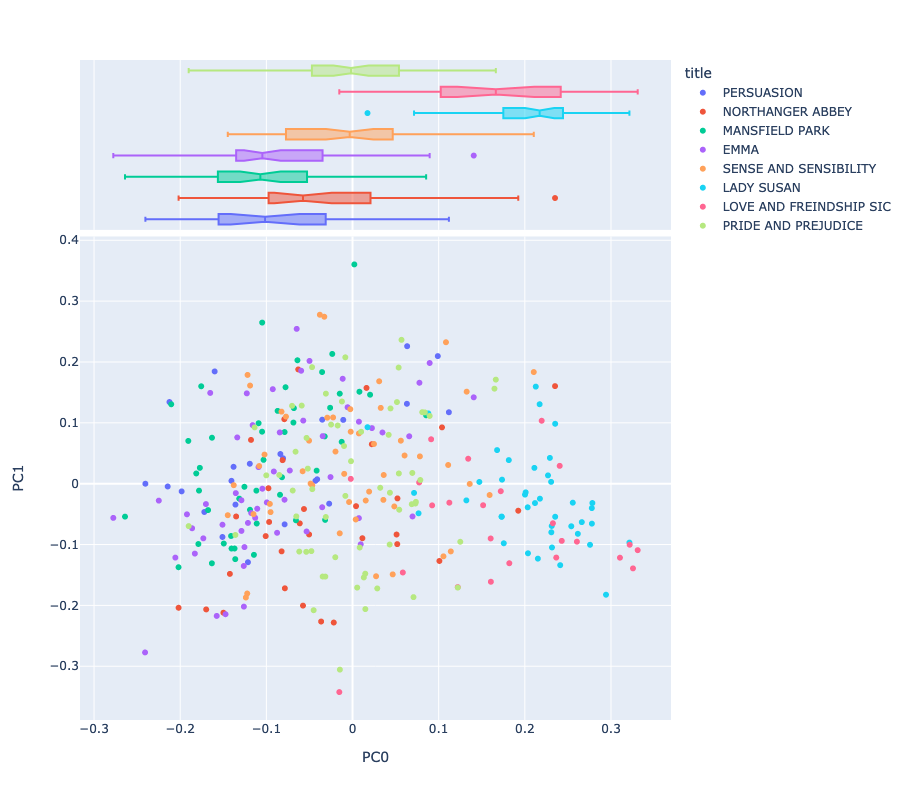

In [16]:
vis_pcs(0, 1)

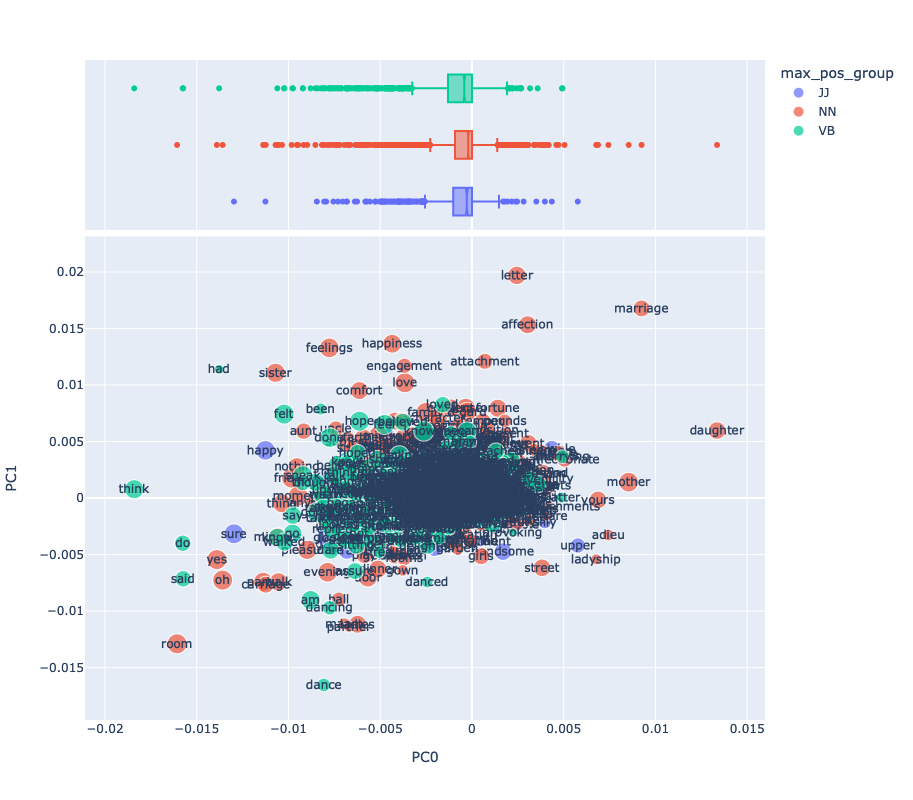

In [17]:
vis_loadings(0, 1)

## PC 1 and 2

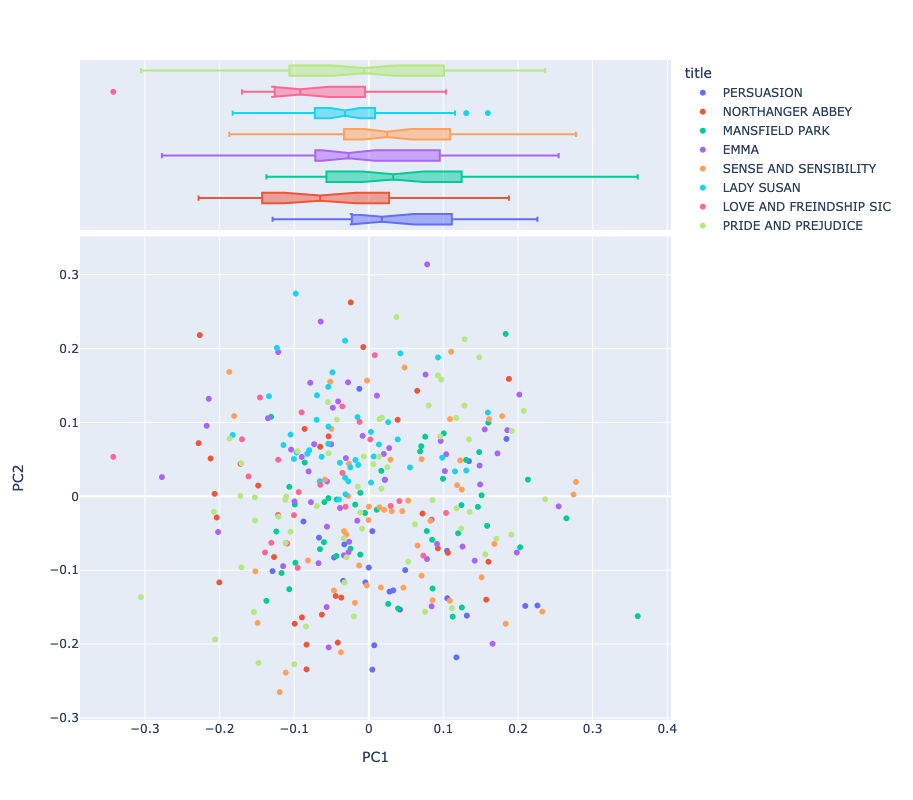

In [18]:
vis_pcs(1, 2)

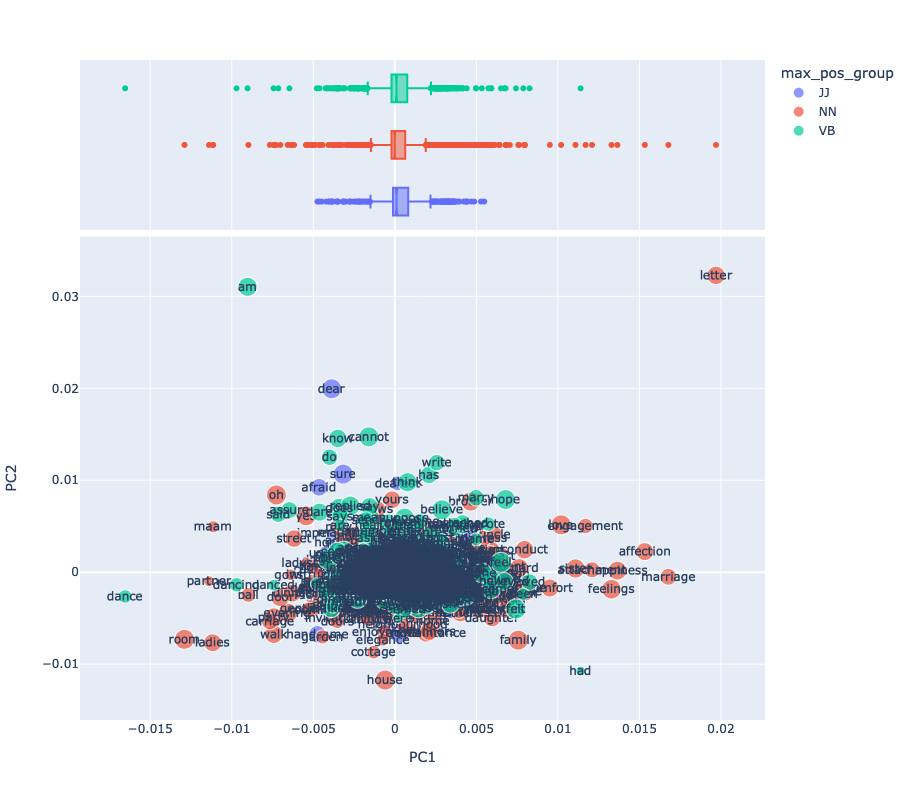

In [19]:
vis_loadings(1, 2)

##  PC 2 and 3

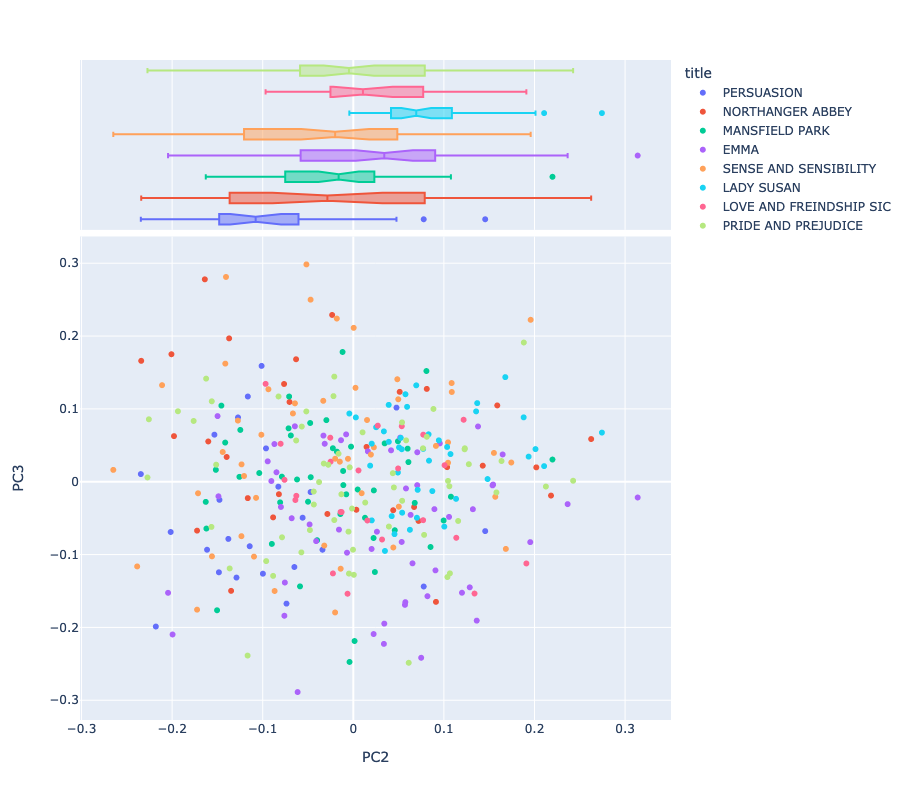

In [20]:
vis_pcs(2, 3)

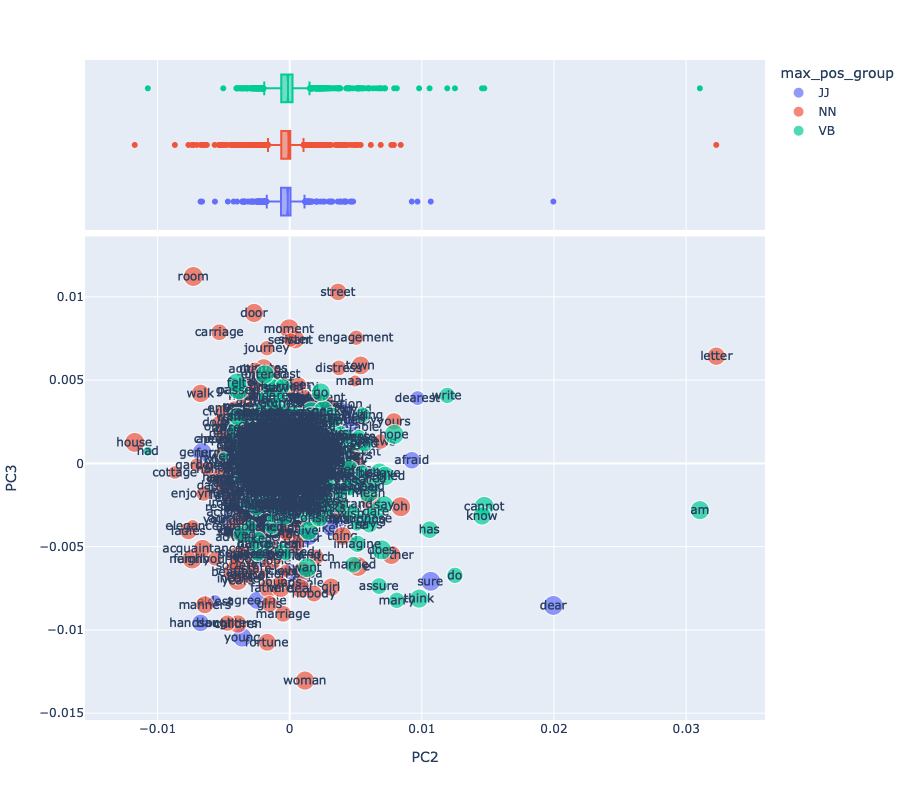

In [21]:
vis_loadings(2, 3)

## Interpet Loadings

In [46]:
top_terms_sk= {}

data = []
for i in range(n_comps):
    for j in [0, 1]:
        data.append((f"PC{i}", j, ' '.join(LOADINGS.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())))

comp_strs = pd.DataFrame(data)
comp_strs.columns =  ['pc', 'pole', 'top_terms']
comp_strs = comp_strs.set_index(['pc', 'pole'])

In [47]:
COMPS = comp_strs

In [48]:
COMPS

top_terms
pc  pole                                                   
PC0 0     daughter marriage mother adieu yours ladyship ...
    1        think room do said yes had oh sure party happy
PC1 0     letter marriage affection happiness feelings a...
    1     dance room partner ladies maam dancing am ball...
PC2 0     letter am dear cannot know do write sure has t...
    1     house had cottage ladies family elegance room ...
PC3 0     room street door moment carriage engagement si...
    1     woman fortune young children daughters handsom...
PC4 0     mother sister sisters married dear daughters p...
    1     feelings ball dearest friendship friend upper ...

In [64]:
COMPS['top_doc'] = pd.concat([DCM[pc_cols].idxmax(), DCM[pc_cols].idxmin()], axis=0, keys=[0,1])\
    .to_frame('top_doc')\
    .reset_index()\
    .rename(columns={'level_0':'pole', 'level_1':'pc'})\
    .set_index(['pc','pole'])\
    .sort_index()

In [65]:
COMPS

top_terms     top_doc
pc  pole                                                               
PC0 0     daughter marriage mother adieu yours ladyship ...   (1212, 3)
    1        think room do said yes had oh sure party happy   (158, 26)
PC1 0     letter marriage affection happiness feelings a...   (141, 48)
    1     dance room partner ladies maam dancing am ball...  (1212, 22)
PC2 0     letter am dear cannot know do write sure has t...    (158, 7)
    1     house had cottage ladies family elegance room ...    (161, 6)
PC3 0     room street door moment carriage engagement si...   (161, 28)
    1     woman fortune young children daughters handsom...    (158, 4)
PC4 0     mother sister sisters married dear daughters p...  (1342, 49)
    1     feelings ball dearest friendship friend upper ...   (158, 16)

In [83]:
TFIDF.loc[(141, 48)].sort_values(ascending=False).head(20)

term_str
comfort           0.199332
temper            0.157645
punishment        0.154787
happiness         0.154134
became            0.122797
disappointment    0.117290
had               0.106504
disposition       0.103386
domestic          0.096353
parent            0.087745
guilt             0.087035
education         0.086026
useful            0.083851
loved             0.083372
been              0.080967
sense             0.080872
feelings          0.080283
anger             0.077965
vanity            0.075981
niece             0.075244
Name: (141, 48), dtype: float64

# Cluster Loadings

In [91]:
from sklearn.cluster import KMeans
from string import ascii_uppercase as ltrs

In [96]:
k = n_comps * 2
LOADINGS['cat'] = [ltrs[i] for i in KMeans(k, n_init=10).fit_predict(LOADINGS[pc_cols])]

In [97]:
LOADINGS['maxpc'] = LOADINGS[pc_cols].idxmax(1)
LOADINGS['minpc'] = LOADINGS[pc_cols].idxmin(1)

In [98]:
LOADINGS.groupby('maxpc').apply(lambda x: ' '.join(x.index))

maxpc
PC0    dark wife form story age beauty heads various ...
PC1    short name given friend knew manner ill known ...
PC2    sure word true find does told hope get hear cr...
PC3    passed sight high rest turned open looking gen...
PC4    hands new fine people face therefore coming ki...
dtype: object

In [29]:
LOADINGS.groupby('minpc').apply(lambda x: ' '.join(x.index))

minpc
PC0    sure hands short word passed fine name sight p...
PC1    keep stand am door black following cold ye tow...
PC2    new general gave water large small house famil...
PC3    therefore love years dear person means young f...
PC4    given doubt feelings common deck dark mine deg...
dtype: object

In [30]:
def vizpc(a, b):
    return px.scatter(LOADINGS.reset_index(), f'PC{a}', f'PC{b}', 
                      color='cat', size='dfidf',
                      hover_name='term_str', 
                      marginal_x='box', height=800, width=900)

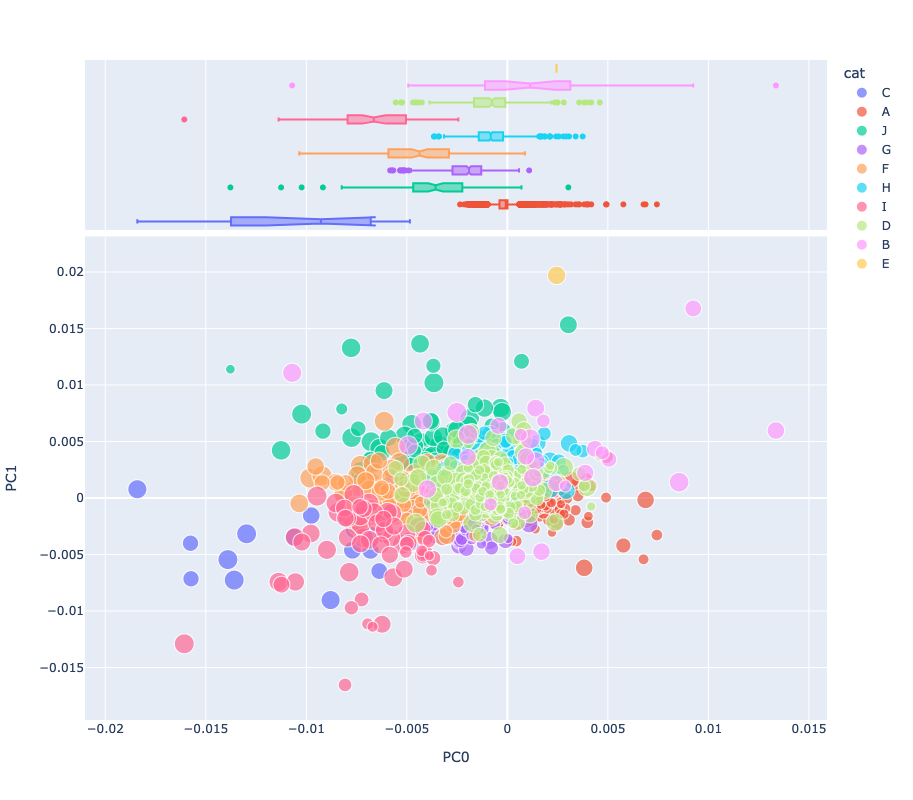

In [31]:
vizpc(0, 1)

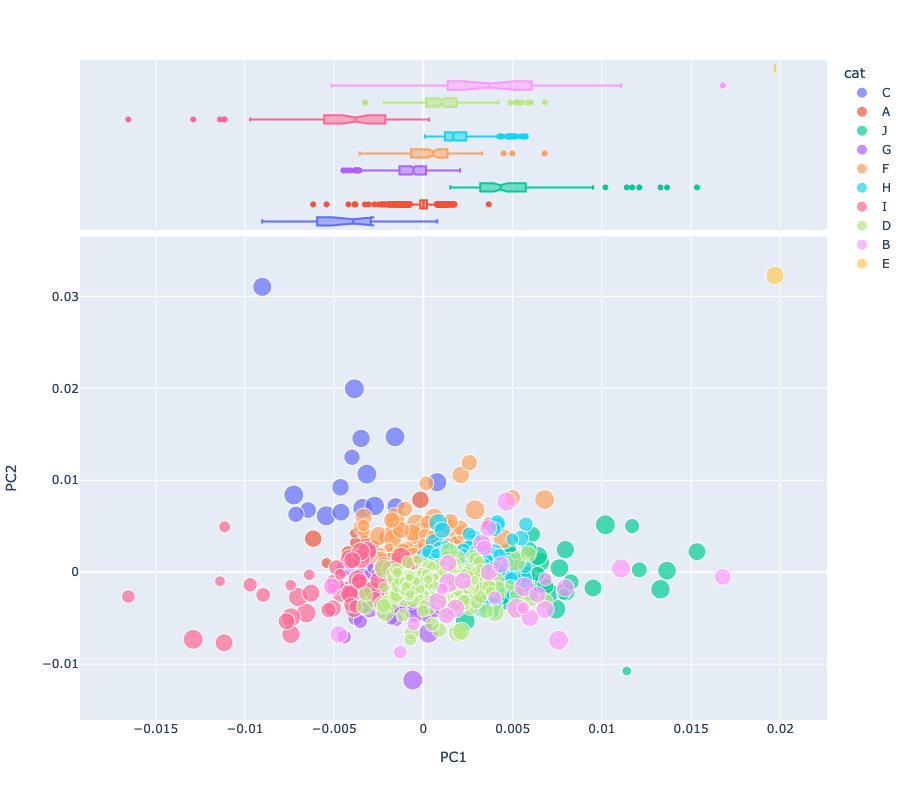

In [32]:
vizpc(1, 2)

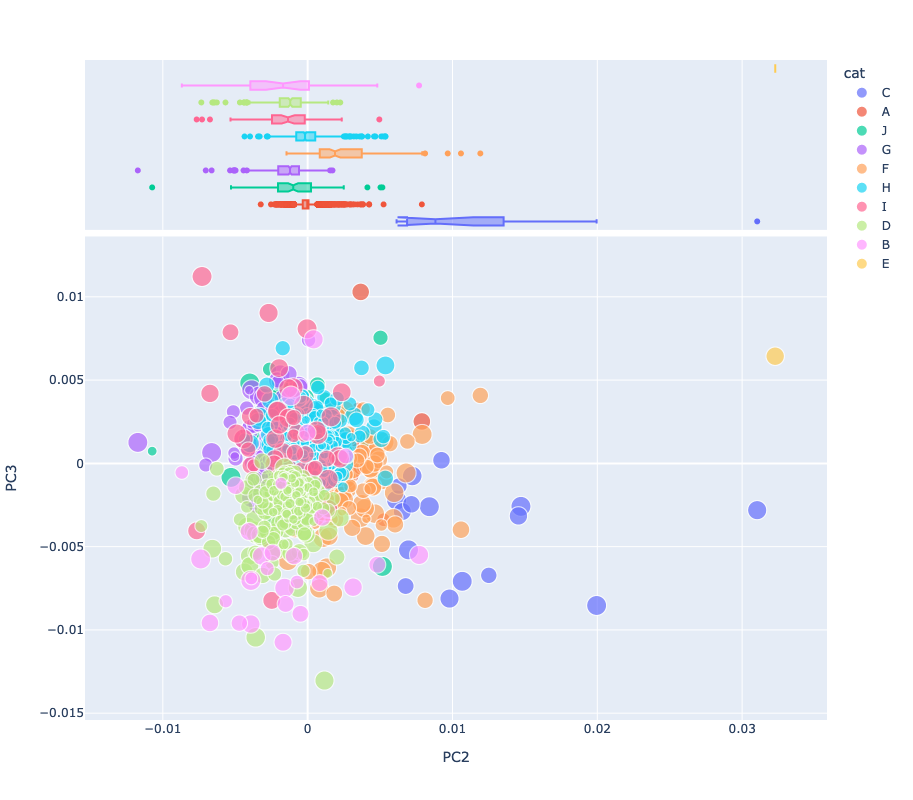

In [33]:
vizpc(2, 3)

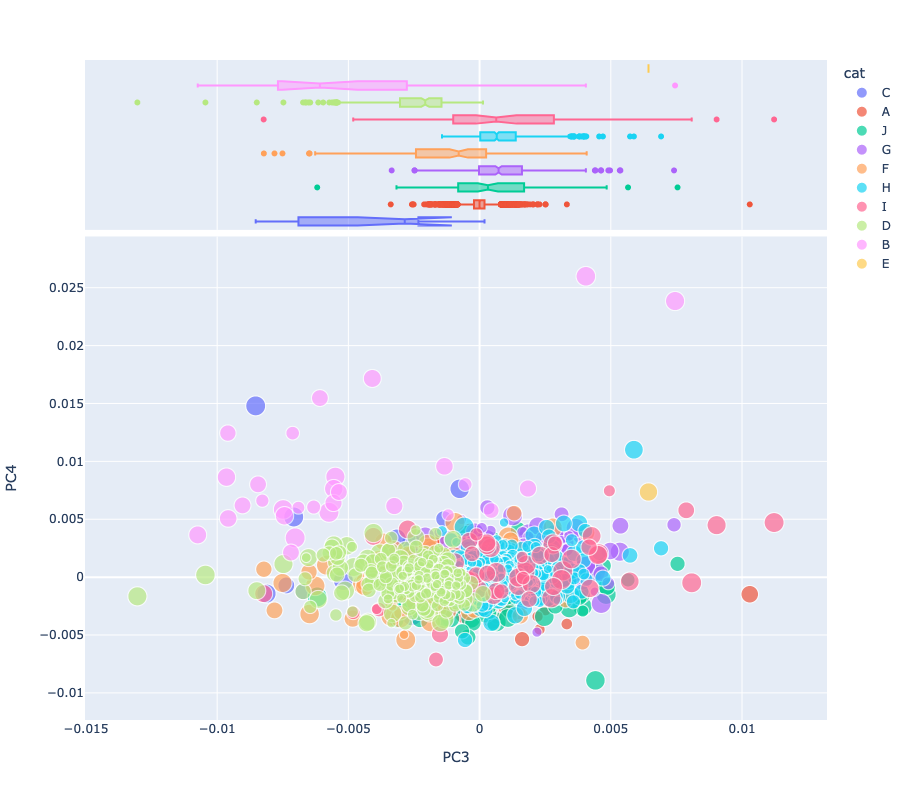

In [34]:
vizpc(3, 4)

# Categories

In [35]:
CATS = LOADINGS.groupby('cat').n.sum().to_frame('n')
CATS['p'] = CATS.n / CATS.n.sum()
CATS['i'] = np.log2(1/CATS.p)
CATS['h'] = CATS.p * CATS.i
CATS['dfidf_mean'] = LOADINGS.groupby('cat').dfidf.mean()
CATS['top_terms'] = LOADINGS.groupby('cat').apply(lambda x: ' '.join(x.sort_values('dfidf', ascending=False).head(10).index))
CATS['maxpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmax(1)
CATS['minpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmin(1)

In [36]:
CATS.sort_values('dfidf_mean', ascending=False).style.background_gradient()

,n,p,i,h,dfidf_mean,top_terms,maxpc,minpc
cat,,,,,,,,
C,25692,0.036164,4.789287,0.173202,525.011026,sure does yes oh dear cannot replied am think know,PC2,PC0
E,657,0.000925,10.078569,0.009321,515.280635,letter,PC2,PC0
I,30329,0.042691,4.549908,0.194242,454.758601,turned looking room get began moment looked going saw evening,PC3,PC0
F,83489,0.117520,3.089020,0.363022,449.430886,word people friend true ill find coming kind told gone,PC2,PC0
J,70245,0.098878,3.338211,0.330075,444.069351,short knew known felt love home feel possible doubt less,PC1,PC0
B,10447,0.014705,6.087518,0.089519,436.795383,years family mother father brother sister year girl children sisters,PC4,PC3
G,123226,0.173454,2.527372,0.438384,352.355124,new passed fine sight rest face open general took brought,PC3,PC0
D,51047,0.071854,3.798780,0.272959,315.426666,making person means company young second common death live woman,PC1,PC3
H,78272,0.110177,3.182110,0.350594,287.015527,name given manner point therefore certain course taken strange reason,PC1,PC0


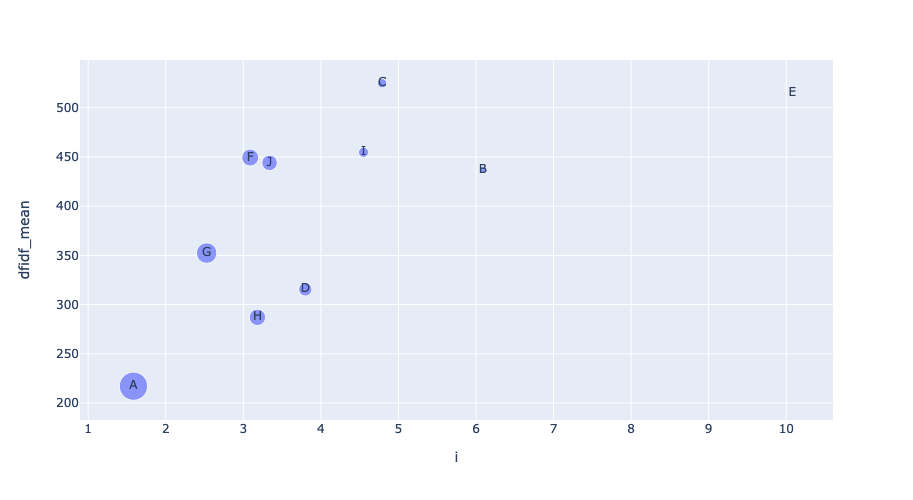

In [37]:
px.scatter(CATS.reset_index(), 'i', 'dfidf_mean', 
           hover_name='top_terms',
           text='cat', size='n', 
           height=500, width=600)